# Music Generation with Neural Newtorks

This project goes through generation of musical notes using neural networks. It is based on a collection of piano MIDI files from the [MAESTRO dataset](https://magenta.tensorflow.org/datasets/maestro). Different approaches are used, such as Variable AutoEncoders, Recursive Neural Networks and Generative Adversarial Networks. 
The aim is to understand differences, produce code to test the topologies and evaluate a summary in the end.

# Setup and Introduction to MIDI

## Install Python Packages

We will use the [`pretty_midi`](https://github.com/craffel/pretty-midi) library to create and parse MIDI files, and we will generate audio playback in Jupter Notebook Audio.

In [1]:
%pip install tensorflow wheel numpy pandas matplotlib seaborn pretty-midi ipython scipy scikit-learn midi_neural_processor keras_hub

Note: you may need to restart the kernel to use updated packages.


In [2]:
import collections
import datetime
import scipy
import tempfile
import glob
import numpy as np
import pathlib
import pandas as pd
import pretty_midi
import seaborn as sns
import tensorflow as tf
import keras
import os
import urllib
from zipfile import ZipFile
import midi_neural_processor.processor as midi_tokenizer 
import pathlib 
import random
from keras_hub import layers as hub_layers

from IPython import display
from matplotlib import pyplot as plt
from typing import Optional

print(tf.config.list_physical_devices('GPU'))

2025-06-16 18:45:21.822028: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1750092322.253362 1462211 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1750092322.631048 1462211 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1750092324.526515 1462211 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1750092324.526569 1462211 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1750092324.526572 1462211 computation_placer.cc:177] computation placer alr

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [3]:
seed = 42
tf.random.set_seed(seed)
np.random.seed(seed)

# Sampling rate for audio playback
_SAMPLING_RATE = 16000

## Download the Maestro dataset

In [4]:
data_dir = "maestro-v3.0.0"
if not os.path.exists(data_dir):
    url = 'https://storage.googleapis.com/magentadata/datasets/maestro/v3.0.0/maestro-v3.0.0-midi.zip'
    file_name = 'maestro-v3.0.0-midi.zip'
    
    urllib.request.urlretrieve(url, file_name)
    
    with ZipFile(file_name, 'r') as zip_file:
        zip_file.extractall()
    
    print("Files downloaded successfully")
    os.remove(file_name)
else:
    print("Dataset found")

Dataset found


The dataset contains about 1,200 MIDI files.

In [5]:
filenames = glob.glob(str(data_dir+ "/**/*.mid*"))
print('Number of files:', len(filenames))

Number of files: 1276


## Process a MIDI file

First, use ```pretty_midi``` to parse a single MIDI file and inspect the format of the notes. If you would like to download the MIDI file below to play on your computer, you can do so in colab by writing ```files.download(sample_file)```.


In [6]:
sample_file = filenames[1]
print(sample_file)

maestro-v3.0.0/2015/MIDI-Unprocessed_R2_D2-19-21-22_mid--AUDIO-from_mp3_22_R2_2015_wav--4.midi


Generate a `PrettyMIDI` object for the sample MIDI file.

In [7]:
pm = pretty_midi.PrettyMIDI(sample_file)

Play the sample file. The playback widget may take several seconds to load.

In [8]:
import scipy.io.wavfile as wavfile
import tempfile
import os
from IPython.display import Audio
import io

def display_audio(pm: pretty_midi.PrettyMIDI, seconds=120, save_path=None):
    """
    Generate audio and save to file instead of playing directly
    """
    # Basic synthesis (you can improve this)
    waveform = synthesize_midi_basic(pm, _SAMPLING_RATE)
    
    # Take a sample of the generated waveform
    waveform_short = waveform[:seconds*_SAMPLING_RATE]
    
    # Normalize and convert to int16
    waveform_normalized = np.clip(waveform_short, -1, 1)

    # Save to file
    if save_path is not None:
        audio_data = (waveform_normalized * 32767).astype(np.int16)
        save_path = f"output_audio_{datetime.datetime.now().strftime('%Y%m%d_%H%M%S')}.wav"
        wavfile.write(save_path, _SAMPLING_RATE, audio_data)
        print(f"Audio saved to: {save_path}")
    
    return Audio(waveform_normalized, rate=_SAMPLING_RATE)


def synthesize_midi_basic(pm: pretty_midi.PrettyMIDI, fs: int):
    """
    Basic MIDI synthesis without external dependencies
    """
    total_samples = int((pm.get_end_time() + 1) * fs)
    waveform = np.zeros(total_samples)
    
    for instrument in pm.instruments:
        if instrument.is_drum:
            continue
            
        for note in instrument.notes:
            start_sample = int(note.start * fs)
            end_sample = int(note.end * fs)
            duration = end_sample - start_sample
            
            if duration > 0 and end_sample <= len(waveform):
                # Generate sine wave
                frequency = pretty_midi.note_number_to_hz(note.pitch)
                t = np.linspace(0, note.end - note.start, duration)
                note_wave = 0.3 * np.sin(2 * np.pi * frequency * t)
                
                # Simple envelope
                fade_samples = min(int(0.01 * fs), duration // 4)
                envelope = np.ones_like(note_wave)
                if fade_samples > 0:
                    envelope[:fade_samples] = np.linspace(0, 1, fade_samples)
                    envelope[-fade_samples:] = np.linspace(1, 0, fade_samples)
                note_wave *= envelope
                
                waveform[start_sample:end_sample] += note_wave
    
    return waveform

In [9]:
display_audio(pm)

MIDI gives us access to interesting data for the track:

In [10]:
print('Number of instruments:', len(pm.instruments))
instrument = pm.instruments[0]
instrument_name = pretty_midi.program_to_instrument_name(instrument.program)
print('Instrument name:', instrument_name)

Number of instruments: 1
Instrument name: Acoustic Grand Piano


## Extract notes

In [11]:
for i, note in enumerate(instrument.notes[:10]):
  note_name = pretty_midi.note_number_to_name(note.pitch)
  duration = note.end - note.start
  print(f'{i}: pitch={note.pitch}, note_name={note_name},'
        f' duration={duration:.4f}')

0: pitch=43, note_name=G2, duration=0.4146
1: pitch=50, note_name=D3, duration=0.1083
2: pitch=55, note_name=G3, duration=0.0812
3: pitch=59, note_name=B3, duration=0.1344
4: pitch=62, note_name=D4, duration=0.1583
5: pitch=59, note_name=B3, duration=0.0490
6: pitch=55, note_name=G3, duration=0.0750
7: pitch=50, note_name=D3, duration=0.0875
8: pitch=43, note_name=G2, duration=0.1292
9: pitch=50, note_name=D3, duration=0.0854


You will use three variables to represent a note when training the model: `pitch`, `step` and `duration`. The pitch is the perceptual quality of the sound as a MIDI note number. 
The `step` is the time elapsed from the previous note or start of the track.
The `duration` is how long the note will be playing in seconds and is the difference between the note end and note start times. 


Extract the notes from the sample MIDI file.

In [12]:
def midi_to_notes(midi_file: str) -> pd.DataFrame:
  pm = pretty_midi.PrettyMIDI(midi_file)
  instrument = pm.instruments[0]
  notes = collections.defaultdict(list)

  # Sort the notes by start time
  sorted_notes = sorted(instrument.notes, key=lambda note: note.start)
  prev_start = sorted_notes[0].start

  for note in sorted_notes:
    start = note.start
    end = note.end
    notes['pitch'].append(note.pitch)
    notes['start'].append(start)
    notes['end'].append(end)
    notes['step'].append(start - prev_start)
    notes['duration'].append(end - start)
    prev_start = start

  return pd.DataFrame({name: np.array(value) for name, value in notes.items()})

In [13]:
raw_notes = midi_to_notes(sample_file)
raw_notes.head()

,pitch,start,end,step,duration
0,43,1.014583,1.429167,0.000000,0.414583
1,50,1.401042,1.509375,0.386458,0.108333
2,55,1.608333,1.689583,0.207292,0.081250
3,59,1.785417,1.919792,0.177083,0.134375
4,62,1.967708,2.126042,0.182292,0.158333


It may be easier to interpret the note names rather than the pitches, so you can use the function below to convert from the numeric pitch values to note names. 
The note name shows the type of note, accidental and octave number
(e.g. C#4). 

In [14]:
get_note_names = np.vectorize(pretty_midi.note_number_to_name)
sample_note_names = get_note_names(raw_notes['pitch'])
sample_note_names[:10]

array(['G2', 'D3', 'G3', 'B3', 'D4', 'B3', 'G3', 'D3', 'G2', 'D3'],
      dtype='<U3')

To visualize the musical piece, plot the note pitch, start and end across the length of the track (i.e. piano roll). Start with the first 100 notes

In [15]:
def plot_piano_roll(notes: pd.DataFrame, count: Optional[int] = None):
  if count:
    title = f'First {count} notes'
  else:
    title = f'Whole track'
    count = len(notes['pitch'])
  plt.figure(figsize=(20, 4))
  plot_pitch = np.stack([notes['pitch'], notes['pitch']], axis=0)
  plot_start_stop = np.stack([notes['start'], notes['end']], axis=0)
  plt.plot(
      plot_start_stop[:, :count], plot_pitch[:, :count], color="b", marker=".")
  plt.xlabel('Time [s]')
  plt.ylabel('Pitch')
  _ = plt.title(title)

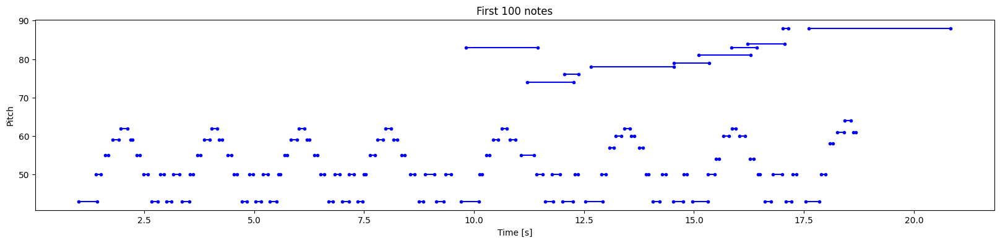

In [16]:
plot_piano_roll(raw_notes, count=100)

Plot the notes for the entire track.

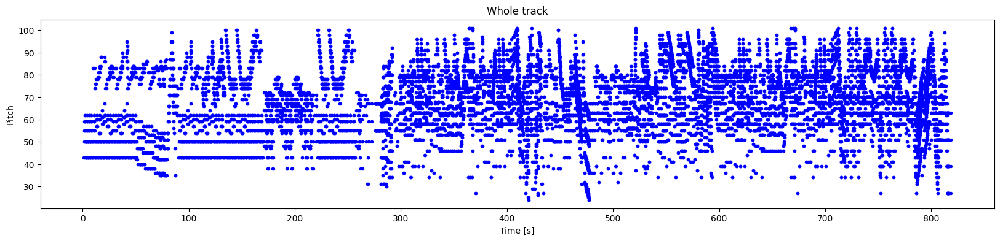

In [17]:
plot_piano_roll(raw_notes)

Check the distribution of each note variable.

In [18]:
def plot_distributions(notes: pd.DataFrame, drop_percentile=2.5):
  plt.figure(figsize=[15, 5])
  plt.subplot(1, 3, 1)
  sns.histplot(notes, x="pitch", bins=20)

  plt.subplot(1, 3, 2)
  max_step = np.percentile(notes['step'], 100 - drop_percentile)
  sns.histplot(notes, x="step", bins=np.linspace(0, max_step, 21))
  
  plt.subplot(1, 3, 3)
  max_duration = np.percentile(notes['duration'], 100 - drop_percentile)
  sns.histplot(notes, x="duration", bins=np.linspace(0, max_duration, 21))

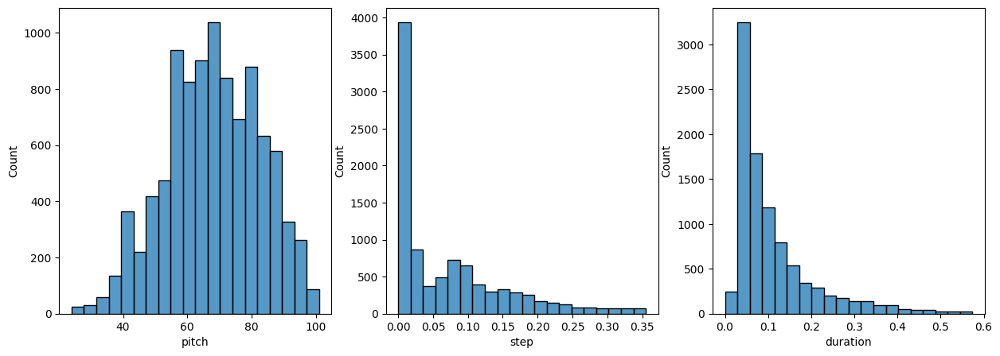

In [19]:
plot_distributions(raw_notes)

## Create a MIDI file

You can generate your own MIDI file from a list of notes using the function below.

In [20]:
def notes_to_midi(
  notes: pd.DataFrame,
  out_file: str, 
  instrument_name: str,
  velocity: int = 100,  # note loudness
) -> pretty_midi.PrettyMIDI:

  pm = pretty_midi.PrettyMIDI()
  instrument = pretty_midi.Instrument(
      program=pretty_midi.instrument_name_to_program(
          instrument_name))

  prev_start = 0
  for i, note in notes.iterrows():
    start = float(prev_start + note['step'])
    end = float(start + note['duration'])
    note = pretty_midi.Note(
        velocity=velocity,
        pitch=int(note['pitch']),
        start=start,
        end=end,
    )
    instrument.notes.append(note)
    prev_start = start

  pm.instruments.append(instrument)
  pm.write(out_file)
  return pm

In [21]:
example_file = 'example.midi'
example_pm = notes_to_midi(
    raw_notes, out_file=example_file, instrument_name=instrument_name)

Play the generated MIDI file and see if there is any difference.

In [22]:
display_audio(example_pm)

As before, you can write ```files.download(example_file)``` to download and play this file.

# Music Generation with RNNs

## Create the training dataset


Create the training dataset by extracting notes from the MIDI files. In this experiment, we use only 5 songs, use more for better results!

In [104]:
num_files = 5
all_notes = []
for f in filenames[:num_files]:
  notes = midi_to_notes(f)
  all_notes.append(notes)

all_notes = pd.concat(all_notes)

In [105]:
n_notes = len(all_notes)
print('Number of notes parsed:', n_notes)

Number of notes parsed: 20266


Next, create a `tf.data.Dataset` from the parsed notes.

In [106]:
key_order = ['pitch', 'step', 'duration']
train_notes = np.stack([all_notes[key] for key in key_order], axis=1)
train_notes

array([[2.60000000e+01, 0.00000000e+00, 9.72500000e+00],
       [3.80000000e+01, 2.77083333e-01, 9.54479167e+00],
       [5.00000000e+01, 3.16666667e-01, 2.67708333e-01],
       ...,
       [4.50000000e+01, 2.58541667e+00, 6.18333333e+00],
       [2.90000000e+01, 4.06250000e-01, 6.34583333e+00],
       [5.30000000e+01, 4.16666667e-03, 6.31979167e+00]])

In [107]:
notes_ds = tf.data.Dataset.from_tensor_slices(train_notes)
notes_ds.element_spec

TensorSpec(shape=(3,), dtype=tf.float64, name=None)

We will train the model on batches of sequences of notes. Each example will consist of a sequence of notes as the input features, and the next note as the label. In this way, the model will be trained to predict the next note in a sequence.

In [108]:
def create_sequences(
    dataset: tf.data.Dataset, 
    seq_length: int,
    vocab_size = 128, # midi
) -> tf.data.Dataset:
  """Returns TF Dataset of sequence and label examples."""
  seq_length = seq_length+1

  # Take 1 extra for the labels
  windows = dataset.window(seq_length, shift=1, stride=1,
                              drop_remainder=True)

  # `flat_map` flattens the" dataset of datasets" into a dataset of tensors
  flatten = lambda x: x.batch(seq_length, drop_remainder=True)
  sequences = windows.flat_map(flatten)
  
  # Normalize note pitch
  def scale_pitch(x):
    x = x/[vocab_size,1.0,1.0]
    return x

  # Split the labels
  def split_labels(sequences):
    inputs = sequences[:-1]
    labels_dense = sequences[-1]
    labels = {key:labels_dense[i] for i,key in enumerate(key_order)}

    return scale_pitch(inputs), labels

  return sequences.map(split_labels, num_parallel_calls=tf.data.AUTOTUNE)

Set the sequence length for each example. We experiment with different length 50 and check if it works best for the data. The size of the vocabulary (`vocab_size`) is set to 128 representing all the pitches supported by `pretty_midi`.

In [109]:
seq_length = 50
vocab_size = 128
seq_ds = create_sequences(notes_ds, seq_length, vocab_size)
seq_ds.element_spec

(TensorSpec(shape=(50, 3), dtype=tf.float64, name=None),
 {'pitch': TensorSpec(shape=(), dtype=tf.float64, name=None),
  'step': TensorSpec(shape=(), dtype=tf.float64, name=None),
  'duration': TensorSpec(shape=(), dtype=tf.float64, name=None)})

The shape of the dataset is ```(50,3)```, meaning that the model will take 50 notes as input, and learn to predict the following note as output.

In [110]:
for seq, target in seq_ds.take(1):
  print('sequence shape:', seq.shape)
  print('sequence elements (first 10):', seq[0: 10])
  print()
  print('target:', target)

sequence shape: (50, 3)
sequence elements (first 10): tf.Tensor(
[[0.203125   0.         9.725     ]
 [0.296875   0.27708333 9.54479167]
 [0.390625   0.31666667 0.26770833]
 [0.40625    0.22708333 0.175     ]
 [0.4140625  0.13958333 0.12708333]
 [0.4296875  0.12604167 0.14895833]
 [0.4453125  0.12604167 0.11875   ]
 [0.4609375  0.08958333 0.12291667]
 [0.4765625  0.096875   0.078125  ]
 [0.484375   0.08958333 0.21041667]], shape=(10, 3), dtype=float64)

target: {'pitch': <tf.Tensor: shape=(), dtype=float64, numpy=77.0>, 'step': <tf.Tensor: shape=(), dtype=float64, numpy=0.08958333333333357>, 'duration': <tf.Tensor: shape=(), dtype=float64, numpy=0.08020833333333321>}


Batch the examples, and configure the dataset for performance.

In [111]:
batch_size = 64
buffer_size = n_notes - seq_length  # the number of items in the dataset
train_ds = (seq_ds
            .shuffle(buffer_size)
            .batch(batch_size, drop_remainder=True)
            .cache()
            .prefetch(tf.data.experimental.AUTOTUNE))

In [112]:
train_ds.element_spec

(TensorSpec(shape=(64, 50, 3), dtype=tf.float64, name=None),
 {'pitch': TensorSpec(shape=(64,), dtype=tf.float64, name=None),
  'step': TensorSpec(shape=(64,), dtype=tf.float64, name=None),
  'duration': TensorSpec(shape=(64,), dtype=tf.float64, name=None)})

## Create and train the model

The model will have three outputs, one for each note variable. For `step` and `duration`, you will use a custom loss function based on mean squared error that encourages the model to output non-negative values.

In [113]:
def mse_with_positive_pressure(y_true: tf.Tensor, y_pred: tf.Tensor):
  mse = (y_true - y_pred) ** 2
  positive_pressure = 10 * tf.maximum(-y_pred, 0.0)
  return tf.reduce_mean(mse + positive_pressure)

In [114]:
input_shape = (seq_length, 3)
learning_rate = 0.005

inputs = keras.Input(input_shape)
x = keras.layers.LSTM(128)(inputs)

outputs = {
  'pitch': keras.layers.Dense(128, name='pitch')(x),
  'step': keras.layers.Dense(1, name='step')(x),
  'duration': keras.layers.Dense(1, name='duration')(x),
}

model = keras.Model(inputs, outputs)

loss = {
      'pitch': keras.losses.SparseCategoricalCrossentropy(
          from_logits=True),
      'step': mse_with_positive_pressure,
      'duration': mse_with_positive_pressure,
}

optimizer = keras.optimizers.Adam(learning_rate=learning_rate)

model.compile(loss=loss, optimizer=optimizer) # type: ignore

model.summary()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 50, 3)     │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_2 (LSTM)       │ (None, 128)       │     67,584 │ input_layer_2[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ duration (Dense)    │ (None, 1)         │        129 │ lstm_2[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pitch (Dense)       │ (None, 128)       │     16,512 │ lstm_2[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ step (Dense)        │ (None, 1)         │        129 │ lstm_2[0][0]      │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 84,354 (329.51 KB)

 Trainable params: 84,354 (329.51 KB)

 Non-trainable params: 0 (0.00 B)

Testing the `model.evaluate` function, you can see that the `pitch` loss is significantly greater than the `step` and `duration` losses. 
Note that `loss` is the total loss computed by summing all the other losses and is currently dominated by the `pitch` loss.

In [115]:
losses = model.evaluate(train_ds, return_dict=True)
losses

315/315 ━━━━━━━━━━━━━━━━━━━━ 6s 15ms/step - duration_loss: 0.7679 - loss: 6.1124 - pitch_loss: 4.8531 - step_loss: 0.4914


/home/metano/Uni/GNN/maestro-gann/venv/lib64/python3.9/site-packages/keras/src/trainers/epoch_iterator.py:160: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


{'duration_loss': 0.7557950615882874,
 'loss': 6.082468032836914,
 'pitch_loss': 4.837912082672119,
 'step_loss': 0.48876339197158813}

One way balance this is to use the `loss_weights` argument to compile:

In [ ]:
model.compile(
    loss=loss,
    loss_weights={
        'pitch': 0.05,
        'step': 1.0,
        'duration':1.0,
    },
    optimizer=optimizer,
)

The `loss` then becomes the weighted sum of the individual losses.

In [121]:
model.evaluate(train_ds, return_dict=True)

315/315 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - duration_loss: 0.1852 - loss: 0.4215 - pitch_loss: 3.8542 - step_loss: 0.0436


{'duration_loss': 0.17213326692581177,
 'loss': 0.40569010376930237,
 'pitch_loss': 3.8420135974884033,
 'step_loss': 0.041456207633018494}

Train the model.

In [122]:
callbacks = [
    keras.callbacks.ModelCheckpoint(
        filepath='./training_checkpoints/ckpt_{epoch}.weights.h5',
        save_weights_only=True),
    keras.callbacks.EarlyStopping(
        monitor='loss',
        patience=5,
        verbose=1,
        restore_best_weights=True),
]

In [123]:
%%time
epochs = 50

history = model.fit(
    train_ds,
    epochs=epochs,
    callbacks=callbacks,
)

Epoch 1/50
315/315 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - duration_loss: 0.1701 - loss: 0.4055 - pitch_loss: 3.8465 - step_loss: 0.0432
Epoch 2/50
315/315 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - duration_loss: 0.1679 - loss: 0.4016 - pitch_loss: 3.8308 - step_loss: 0.0422
Epoch 3/50
315/315 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step - duration_loss: 0.1661 - loss: 0.3991 - pitch_loss: 3.8228 - step_loss: 0.0419
Epoch 4/50
315/315 ━━━━━━━━━━━━━━━━━━━━ 15s 47ms/step - duration_loss: 0.1657 - loss: 0.3983 - pitch_loss: 3.8136 - step_loss: 0.0419
Epoch 5/50
315/315 ━━━━━━━━━━━━━━━━━━━━ 29s 91ms/step - duration_loss: 0.1654 - loss: 0.3970 - pitch_loss: 3.7960 - step_loss: 0.0418
Epoch 6/50
315/315 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - duration_loss: 0.1641 - loss: 0.3948 - pitch_loss: 3.7900 - step_loss: 0.0411
Epoch 7/50
315/315 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - duration_loss: 0.1627 - loss: 0.3920 - pitch_loss: 3.7616 - step_loss: 0.0412
Epoch 8/50
315/315 ━━━━━━━━━━━━━━━━━━━━ 17s 55ms/step - duratio

2025-06-15 13:31:49.950033: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


315/315 ━━━━━━━━━━━━━━━━━━━━ 13s 42ms/step - duration_loss: 0.1378 - loss: 0.3556 - pitch_loss: 3.6439 - step_loss: 0.0355
Epoch 21/50
315/315 ━━━━━━━━━━━━━━━━━━━━ 14s 45ms/step - duration_loss: 0.1376 - loss: 0.3541 - pitch_loss: 3.6465 - step_loss: 0.0342
Epoch 22/50
315/315 ━━━━━━━━━━━━━━━━━━━━ 15s 46ms/step - duration_loss: 0.1395 - loss: 0.3566 - pitch_loss: 3.6543 - step_loss: 0.0344
Epoch 23/50
315/315 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step - duration_loss: 0.1326 - loss: 0.3472 - pitch_loss: 3.6382 - step_loss: 0.0327
Epoch 24/50
315/315 ━━━━━━━━━━━━━━━━━━━━ 19s 59ms/step - duration_loss: 0.1331 - loss: 0.3492 - pitch_loss: 3.6423 - step_loss: 0.0340
Epoch 25/50
315/315 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - duration_loss: 0.1271 - loss: 0.3427 - pitch_loss: 3.6453 - step_loss: 0.0333
Epoch 26/50
315/315 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - duration_loss: 0.1294 - loss: 0.3422 - pitch_loss: 3.6211 - step_loss: 0.0318
Epoch 27/50
315/315 ━━━━━━━━━━━━━━━━━━━━ 17s 54ms/step - duration_l

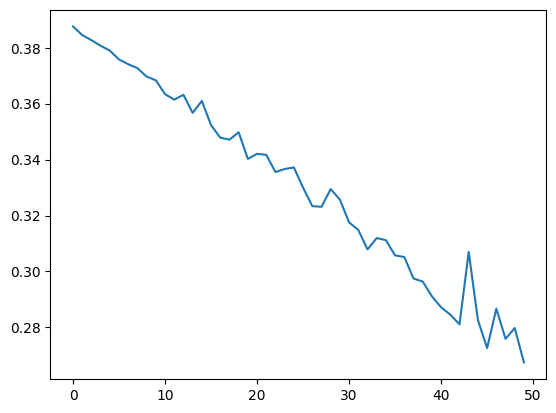

In [124]:
plt.plot(history.epoch, history.history['loss'], label='total loss')
plt.show()

## Generate notes

To use the model to generate notes, you will first need to provide a starting sequence of notes. The function below generates one note from a sequence of notes. 

For note pitch, it draws a sample from the softmax distribution of notes produced by the model, and does not simply pick the note with the highest probability.
Always picking the note with the highest probability would lead to repetitive sequences of notes being generated.

The `temperature` parameter can be used to control the randomness of notes generated. You can find more details on temperature in [Text generation with an RNN](https://www.tensorflow.org/text/tutorials/text_generation).

In [125]:
def predict_next_note(
    notes: np.ndarray, 
    model: keras.Model, 
    temperature: float = 1.0) -> tuple[int, float, float]:
  """Generates a note as a tuple of (pitch, step, duration), using a trained sequence model."""

  assert temperature > 0

  # Add batch dimension
  inputs = tf.expand_dims(notes, 0)

  predictions = model.predict(inputs)
  pitch_logits = predictions['pitch']
  step = predictions['step']
  duration = predictions['duration']
 
  pitch_logits /= temperature
  pitch = tf.random.categorical(pitch_logits, num_samples=1)
  pitch = tf.squeeze(pitch, axis=-1)
  duration = tf.squeeze(duration, axis=-1)
  step = tf.squeeze(step, axis=-1)

  # `step` and `duration` values should be non-negative
  step = tf.maximum(0, step)
  duration = tf.maximum(0, duration)

  return int(pitch), float(step), float(duration)

Now generate some notes. You can play around with temperature and the starting sequence in `next_notes` and see what happens.

In [129]:
temperature = 2.0
num_predictions = 120

sample_notes = np.stack([raw_notes[key] for key in key_order], axis=1)

# The initial sequence of notes; pitch is normalized similar to training
# sequences
input_notes = (
    sample_notes[:seq_length] / np.array([vocab_size, 1, 1]))

generated_notes = []
prev_start = 0
for _ in range(num_predictions):
  pitch, step, duration = predict_next_note(input_notes, model, temperature)
  start = prev_start + step
  end = start + duration
  input_note = (pitch, step, duration)
  generated_notes.append((*input_note, start, end))
  input_notes = np.delete(input_notes, 0, axis=0)
  input_notes = np.append(input_notes, np.expand_dims(input_note, 0), axis=0)
  prev_start = start

generated_notes = pd.DataFrame(
    generated_notes, columns=(*key_order, 'start', 'end'))

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━

In [130]:
generated_notes.head(10)

,pitch,step,duration,start,end
0,55,0.080045,0.077065,0.080045,0.157111
1,68,0.190471,0.038183,0.270516,0.308699
2,81,0.210290,0.125692,0.480806,0.606498
3,74,0.213604,0.164655,0.694410,0.859064
4,79,0.213863,0.155288,0.908272,1.063560
5,81,0.212555,0.164444,1.120827,1.285271
6,84,0.212272,0.167953,1.333099,1.501052
7,79,0.211394,0.172468,1.544493,1.716961
8,79,0.211057,0.164788,1.755550,1.920338
9,79,0.210218,0.164537,1.965768,2.130305


In [131]:
out_file = 'output.mid'
out_pm = notes_to_midi(
    generated_notes, out_file=out_file, instrument_name=instrument_name)
display_audio(out_pm)

Audio saved to: output_audio_20250615_134808.wav


You can also download the audio file by adding the two lines below:

```
from google.colab import files
files.download(out_file)
```

Visualize the generated notes.

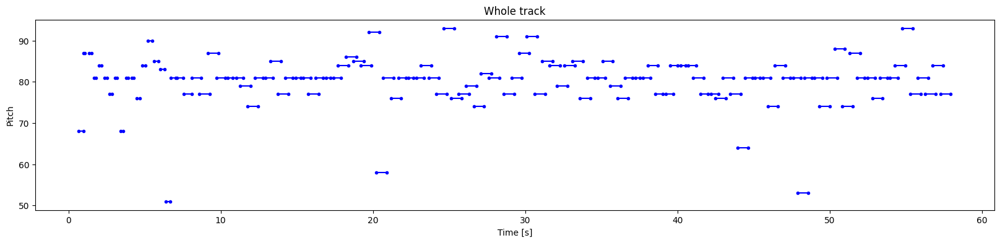

In [51]:
plot_piano_roll(generated_notes)

Check the distributions of `pitch`, `step` and `duration`.

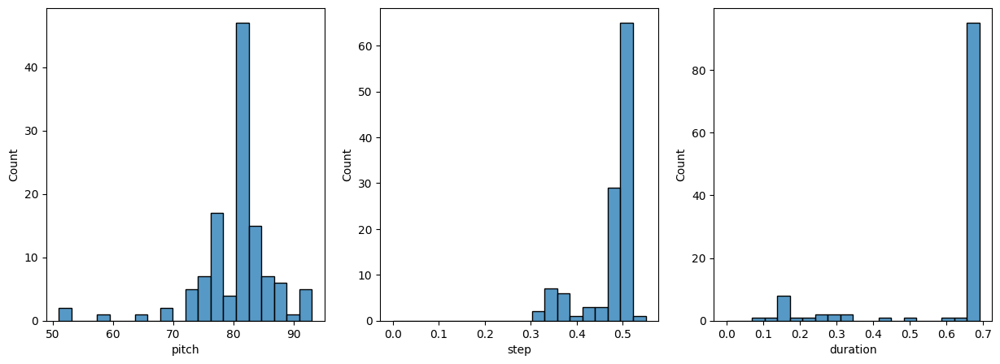

In [52]:
plot_distributions(generated_notes)

In the above plots, you will notice the change in distribution of the note variables.
Since there is a feedback loop between the model's outputs and inputs, the model tends to generate similar sequences of outputs to reduce the loss. 
This is particularly relevant for `step` and `duration`, which uses the MSE loss.
For `pitch`, you can increase the randomness by increasing the `temperature` in `predict_next_note`.


## Output Analysis

Interesting results! But there are little issues. Any listener could easly feel that the harmony is poor. And, did you notice that the output is monophonic? We are training on a poliphonic dataset, so why isn't this reflected on the output?

The RNN module is able to generate only one **one at a time**. This makes generation of chords complicated for the model. Other parameters which could be tuned could be: 
1. Input notes sequence lenght.
2. Represent Chords in the inputs with a advanced representation.
3. Increase dimension of the LSTM layer.
4. Train for more epochs.
5. Use a larger subset of the dataset.
6. Normalize step, duration and pitch for training instead of using loss feature weights.

# Music Generation with VAEs

Getting results for Music Generation with VAEs is pretty much straight forward. Much of the work is don by finding a suitable training set format for the encoder since it's pretty much the core of this kind of model. We will encode music in a latent space and then sample new music generation from this space. 

## Prepare Train Set

We're using **Piano Roll** representation: this tecnology comes from old piano music represented in paper by creating "holes" corresponding to the note to be played by the piano on the y-axes that represents time. It's a simple bi-dimensional representation tipically used also for VAEs in Music.

In [33]:
# Parameters
FRAME_LENGTH = 0.05  # 50ms per frame
SEGMENT_DURATION = 10.0  # seconds
N_FRAMES = int(SEGMENT_DURATION / FRAME_LENGTH)

def notes_to_piano_roll(notes, frame_length=FRAME_LENGTH, segment_duration=SEGMENT_DURATION):
    max_time = max(notes['end'].max(), segment_duration)
    segments = []
    for seg_start in np.arange(0, max_time, segment_duration):
        seg_end = seg_start + segment_duration
        roll = np.zeros((N_FRAMES, 128)) # 128 possible notes played (pitch)
        
        # Filter notes in current segment
        seg_notes = notes[(notes['start'] < seg_end) & (notes['end'] > seg_start)]
        
        for _, note in seg_notes.iterrows():
            pitch = int(note['pitch'])
            start_in_seg = max(0, note['start'] - seg_start)
            end_in_seg = min(segment_duration, note['end'] - seg_start)
            
            # Convert to frame indices
            start_frame = int(start_in_seg / frame_length)
            end_frame = int(np.ceil(end_in_seg / frame_length))
            
            if start_frame < N_FRAMES:
                end_frame = min(end_frame, N_FRAMES)
                roll[start_frame:end_frame, pitch] = 1  # Mark active note (create a hole)
        segments.append(roll)
    return segments

def piano_roll_to_midi(piano_roll, frame_length=FRAME_LENGTH, threshold=0.1):
    pm = pretty_midi.PrettyMIDI()
    instrument = pretty_midi.Instrument(program=0)  # Piano
    
    # Use lower threshold and check for any activations
    piano_roll_binary = (piano_roll > threshold).astype(float)
    
    note_count = 0
    for pitch in range(128):
        # Find note onsets and offsets
        pitch_activations = piano_roll_binary[:, pitch]
        
        if pitch_activations.sum() == 0:
            continue
            
        # Find note boundaries
        diff = np.diff(pitch_activations, prepend=0, append=0)
        starts = np.where(diff == 1)[0]
        ends = np.where(diff == -1)[0]
        
        for start_frame, end_frame in zip(starts, ends):
            start_time = start_frame * frame_length
            end_time = end_frame * frame_length
            
            # Skip very short notes (less than one frame)
            if end_time - start_time < frame_length:
                continue
                
            note = pretty_midi.Note(
                velocity=100,
                pitch=pitch,
                start=start_time,
                end=end_time
            )
            instrument.notes.append(note)
            note_count += 1
    
    print(f"Created {note_count} notes")
    pm.instruments.append(instrument)
    return pm

In [43]:
# Process MIDI files
num_files = 10
all_segments = []
for filename in filenames[:num_files]:
    notes = midi_to_notes(filename)
    segments = notes_to_piano_roll(notes)
    all_segments.extend(segments)

# Convert to numpy array (num_samples, 80, 128, 1)
data = np.array(all_segments)[..., np.newaxis]
print(f"Dataset shape: {data.shape}")

Dataset shape: (438, 200, 128, 1)


## Create and train the model

In [58]:
# Encoder
encoder_inputs = keras.layers.Input(shape=(N_FRAMES, 128, 1))
x = keras.layers.Conv2D(32, (3, 3), activation="relu", strides=2, padding="same")(encoder_inputs)
x = keras.layers.Conv2D(64, (3, 3), activation="relu", strides=2, padding="same")(x)
conv_shape = tf.keras.backend.int_shape(x)[1:]  # type: ignore

x = keras.layers.Flatten()(x)
x = keras.layers.Dense(16, activation="relu")(x)

# Latent space
z_mean = keras.layers.Dense(2, name="z_mean")(x)
z_log_var = keras.layers.Dense(2, name="z_log_var")(x)

# Sampling layer
def sampling(args):
    z_mean, z_log_var = args
    epsilon = tf.random.normal(shape=(tf.shape(z_mean)[0], 2)) # type: ignore
    return z_mean + tf.exp(0.5 * z_log_var) * epsilon

z = keras.layers.Lambda(sampling)([z_mean, z_log_var])

# Decoder
latent_inputs = keras.layers.Input(shape=(2,))
x = keras.layers.Dense(conv_shape[0]*conv_shape[1]*conv_shape[2], activation="relu")(latent_inputs)
x = keras.layers.Reshape(conv_shape)(x)
x = keras.layers.Conv2DTranspose(64, (3, 3), activation="relu", strides=2, padding="same")(x)
x = keras.layers.Conv2DTranspose(32, (3, 3), activation="relu", strides=2, padding="same")(x)
decoder_outputs = keras.layers.Conv2DTranspose(1, (3, 3), activation="sigmoid", padding="same")(x)

# Models
encoder = keras.Model(encoder_inputs, [z_mean, z_log_var, z])
decoder = keras.Model(latent_inputs, decoder_outputs)

class VAE(keras.Model):
    def __init__(self, encoder, decoder, **kwargs):
        super(VAE, self).__init__(**kwargs)
        self.encoder = encoder
        self.decoder = decoder

    def call(self, inputs):
        z_mean, z_log_var, z = self.encoder(inputs)
        reconstruction = self.decoder(z)
        
        # Add KL loss
        kl_loss = -0.5 * tf.reduce_mean(z_log_var - tf.square(z_mean) - tf.exp(z_log_var) + 1)
        self.add_loss(0.005 * kl_loss)
        
        return reconstruction

# Recreate your models properly
vae = VAE(encoder, decoder)
vae.compile(optimizer="adam", loss="binary_crossentropy")
vae.summary()

Model: "vae_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ functional_14 (Functional)      │ ((None, 2), (None, 2), │     1,657,300 │
│                                 │ (None, 2))             │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ functional_15 (Functional)      │ (None, 200, 128, 1)    │       362,881 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,020,181 (7.71 MB)

 Trainable params: 2,020,181 (7.71 MB)

 Non-trainable params: 0 (0.00 B)

In [60]:
# Split data
from sklearn.model_selection import train_test_split
X_train, X_val = train_test_split(data, test_size=0.2, random_state=42)

callback = keras.callbacks.EarlyStopping(
    monitor='loss', 
    patience=5,
    restore_best_weights=True,
    )

# Train
history = vae.fit(
    X_train, X_train,
    validation_data=(X_val, X_val),
    epochs=10,
    batch_size=32,
    callbacks=[callback]
)

Epoch 1/10
11/11 ━━━━━━━━━━━━━━━━━━━━ 8s 779ms/step - loss: 0.0818 - val_loss: 0.0794
Epoch 2/10
11/11 ━━━━━━━━━━━━━━━━━━━━ 7s 679ms/step - loss: 0.0813 - val_loss: 0.0792
Epoch 3/10
11/11 ━━━━━━━━━━━━━━━━━━━━ 7s 665ms/step - loss: 0.0814 - val_loss: 0.0790
Epoch 4/10
11/11 ━━━━━━━━━━━━━━━━━━━━ 7s 682ms/step - loss: 0.0808 - val_loss: 0.0789
Epoch 5/10
11/11 ━━━━━━━━━━━━━━━━━━━━ 7s 647ms/step - loss: 0.0807 - val_loss: 0.0786
Epoch 6/10
11/11 ━━━━━━━━━━━━━━━━━━━━ 7s 688ms/step - loss: 0.0806 - val_loss: 0.0786
Epoch 7/10
11/11 ━━━━━━━━━━━━━━━━━━━━ 7s 680ms/step - loss: 0.0806 - val_loss: 0.0787
Epoch 8/10
11/11 ━━━━━━━━━━━━━━━━━━━━ 7s 659ms/step - loss: 0.0803 - val_loss: 0.0784
Epoch 9/10
11/11 ━━━━━━━━━━━━━━━━━━━━ 7s 663ms/step - loss: 0.0802 - val_loss: 0.0784
Epoch 10/10
11/11 ━━━━━━━━━━━━━━━━━━━━ 7s 663ms/step - loss: 0.0800 - val_loss: 0.0783


In [57]:
# Generate samples from grid in latent space
grid_size = 3
linspace = np.linspace(-2, 2, grid_size)
samples = []

for i in linspace:
    for j in linspace:
        z_sample = np.array([[i, j]])
        generated = decoder.predict(z_sample, verbose='0')[0]
        midi = piano_roll_to_midi(generated.squeeze())
        samples.append(midi)

# Save and play first sample
display_audio(samples[2])

Created 10 notes
Created 5 notes
Created 5 notes
Created 8 notes
Created 4 notes
Created 5 notes
Created 12 notes
Created 10 notes
Created 11 notes


# Music Generation with GANNs


## Prepare Train Set

In [36]:
event_range = midi_tokenizer.RANGE_NOTE_ON
event_range += midi_tokenizer.RANGE_NOTE_OFF
event_range += midi_tokenizer.RANGE_TIME_SHIFT
event_range += midi_tokenizer.RANGE_VEL
CONFIG = keras.utils.Config(
    max_sequence_len=2048,
    embedding_dim=256,
    num_transformer_blocks=6,
    batch_size=6,
    token_pad=event_range,
    token_start_of_sentence=event_range + 1,
    token_end_of_sentence=event_range + 2,
    vocabulary_size=event_range + 3,
    model_out="tmp/music_transformer.keras",
    seed=42,
)
keras.utils.set_random_seed(CONFIG.seed)

In [37]:
#num_files = 120
#midi_inputs = filenames[:num_files]
midi_inputs = filenames
indices = np.random.permutation(len(midi_inputs))
split = int(len(midi_inputs) * 0.1)
train_paths = [midi_inputs[i] for i in indices[split:]]
val_paths = [midi_inputs[i] for i in indices[:split]]
print("train set", len(train_paths))
print("test set", len(val_paths))

train set 1149
test set 127


In [38]:
def encode_midi_task(midi_path):
    """Define a task that tokenizes a MIDI file."""
    return midi_tokenizer.encode_midi(midi_path)


def preprocess_midi_files(file_paths, save_dir=None):
    """Preprocess a list of MIDI files and save the notes to a file."""
    from multiprocessing import Pool, cpu_count

    # Assume all files are in the same directory and save to the same directory
    save_dir = os.path.dirname(file_paths[0]) if save_dir is None else save_dir
    os.makedirs(save_dir, exist_ok=True)

    # Check if the notes have already been preprocessed
    output_file = os.path.join(save_dir, "notes.npz")
    if os.path.exists(output_file):
        npz_file = np.load(output_file)
        return [npz_file[key] for key in npz_file.keys()]

    # Preprocess the MIDI files in parallel
    progbar = keras.utils.Progbar(len(file_paths), unit_name="MIDI_file", interval=5)
    pool = Pool(cpu_count() - 1)
    all_notes = []
    for notes in pool.imap_unordered(encode_midi_task, file_paths):
        progbar.add(1)
        all_notes.append(np.array(notes))

    # Save the notes to a file
    np.savez(output_file, *all_notes)
    return all_notes

output_dir = "training_data_gann/"
output_dir = tempfile.mkdtemp() if output_dir is None else output_dir
os.makedirs(output_dir, exist_ok=True)

train_midis = preprocess_midi_files(train_paths, os.path.join(output_dir, "train"))
val_midis = preprocess_midi_files(val_paths, os.path.join(output_dir, "val"))

1149/1149 ━━━━━━━━━━━━━━━━━━━━ 233s 201ms/MIDI_file
127/127 ━━━━━━━━━━━━━━━━━━━━ 34s 242ms/MIDI_file


In [39]:
class MidiDataset(keras.utils.PyDataset):
    """A dataset for MIDI files that yields batches of input sequences and target sequences."""

    def __init__(
        self,
        encoded_midis,
        batch_size=CONFIG.batch_size,
        max_sequence_len=CONFIG.max_sequence_len,
    ):
        super(MidiDataset, self).__init__()
        self.batch_size = batch_size
        self.max_sequence_len = max_sequence_len
        self.encoded_midis = encoded_midis
        batches, last_batch_size = divmod(len(encoded_midis), batch_size)
        self._num_batches = batches + int(last_batch_size > 0)
        if len(encoded_midis) < batch_size:
            print(f"WARNING: Dataset size ({len(encoded_midis)}) smaller than batch size ({batch_size})")

    def __len__(self):
        """Get the number of batches."""
        return self._num_batches

    def __getitem__(self, idx):
        """Generate random inputs and corresponding targets for the model."""
        # Same as in the original paper, we always get a random batch.
        # Use random.choices for small datasets
        if len(self.encoded_midis) < self.batch_size:
            batch = random.choices(self.encoded_midis, k=self.batch_size)
        else:
            batch = random.sample(self.encoded_midis, k=self.batch_size)

        # Convert the batch to sequences
        batch_data = [
            self._get_sequence(midi, self.max_sequence_len + 1) for midi in batch
        ]
        batch_data = np.array(batch_data)

        # Split the data into input and target sequences
        return batch_data[:, :-1], batch_data[:, 1:]

    def _get_sequence(self, data, max_length):
        """Get a random sequence of notes from a file."""
        # Truncate or pad the sequence
        if len(data) > max_length:
            start = random.randrange(0, len(data) - max_length)
            data = data[start : start + max_length]
        elif len(data) < max_length:
            data = np.append(data, CONFIG.token_end_of_sentence)

        # Pad the sequence if necessary
        if len(data) < max_length:
            data = np.concatenate(
                (data, np.full(max_length - len(data), CONFIG.token_pad))
            )
        return np.asanyarray(data, dtype="int32")


train_dataset, val_dataset = MidiDataset(train_midis), MidiDataset(val_midis)

In [40]:
@keras.utils.register_keras_serializable()
class RelativeGlobalAttention(keras.layers.Layer):
    """
    From Music Transformer (Huang et al., 2018)
    https://arxiv.org/abs/1809.04281
    """

    def __init__(self, num_heads, embedding_dim, max_sequence_len, **kwargs):
        super().__init__(**kwargs)
        self.key_length = None
        self.max_sequence_len = max_sequence_len
        self.relative_embedding = None
        self.num_heads = num_heads
        self.embedding_dim = embedding_dim
        self.head_dim = embedding_dim // num_heads
        self.query_dense = keras.layers.Dense(int(self.embedding_dim))
        self.key_dense = keras.layers.Dense(int(self.embedding_dim))
        self.value_dense = keras.layers.Dense(int(self.embedding_dim))
        self.output_dense = keras.layers.Dense(embedding_dim, name="output")

    def build(self, input_shape):
        self.query_length = input_shape[0][1]
        self.key_length = input_shape[1][1]
        self.relative_embedding = self.add_weight(
            (self.max_sequence_len, int(self.head_dim)), name="relative_embedding"
        )

    def _apply_dense_layer_and_split_heads(self, inputs, dense_layer):
        # Apply linear transformation
        inputs = dense_layer(inputs)
        new_shape = keras.ops.shape(inputs)
        # Reshape to split by attention heads
        reshaped = keras.ops.reshape(inputs, (new_shape[0], new_shape[1], self.num_heads, -1))
        # Transpose for head-first format
        return keras.ops.transpose(reshaped, (0, 2, 1, 3))

    def call(self, inputs, mask=None):
        # Compute Q, K, V: Batch, head, sequence, features
        query = self._apply_dense_layer_and_split_heads(inputs[0], self.query_dense)
        key = self._apply_dense_layer_and_split_heads(inputs[1], self.key_dense)
        value = self._apply_dense_layer_and_split_heads(inputs[2], self.value_dense)

        # Compute scaled dot-product attention scores
        attention_scores = keras.ops.matmul(query, keras.ops.transpose(key, [0, 1, 3, 2]))

        # Compute relative positional encoding and combine with attention scores
        start_idx = max(0, self.max_sequence_len - keras.ops.shape(query)[2])
        relative_embedding = self.relative_embedding[start_idx:, :]
        attention_scores += self._compute_attention_scores(query, relative_embedding)
        logits = attention_scores / keras.ops.sqrt(self.head_dim)

        # Apply mask if provided
        if mask is not None:
            logits += keras.ops.cast(mask, "float32") * -1e9

        # Compute attention weights
        attention_weights = keras.ops.nn.softmax(logits, axis=-1)
        attention_output = keras.ops.matmul(attention_weights, value)

        # Merge heads and apply final linear transformation
        merged_attention = keras.ops.transpose(attention_output, (0, 2, 1, 3))
        merged_attention = keras.ops.reshape(
            merged_attention, (keras.ops.shape(merged_attention)[0], -1, self.embedding_dim)
        )
        output = self.output_dense(merged_attention)

        return output, attention_weights

    def _compute_attention_scores(self, query, relative_embedding):
        """
        Compute relative attention scores using positional encodings.
        """
        relative_scores = keras.ops.einsum("bhld, md->bhlm", query, relative_embedding)
        relative_scores = self._apply_mask_to_relative_scores(relative_scores)
        return self._skew_attention_scores(relative_scores)

    def _apply_mask_to_relative_scores(self, scores):
        """
        Apply masking to relative positional scores to ignore future positions.
        """
        mask = keras.ops.flip(
            keras.ops.tri(scores.shape[-2], scores.shape[-1], dtype="float32"), axis=1
        )
        return mask * scores

    def _skew_attention_scores(self, scores):
        """
        Perform skewing operation to align relative attention scores with the sequence.
        """
        padded_scores = keras.ops.pad(scores, ((0, 0), (0, 0), (0, 0), (1, 0)))
        padded_shape = keras.ops.shape(padded_scores)
        reshaped_scores = keras.ops.reshape(
            padded_scores, (-1, padded_shape[1], padded_shape[-1], padded_shape[-2])
        )
        skewed_scores = reshaped_scores[:, :, 1:, :]

        if self.key_length > self.query_length:
            size_diff = self.key_length - self.query_length
            return keras.ops.pad(skewed_scores, [[0, 0], [0, 0], [0, 0], [0, size_diff]])
        else:
            return skewed_scores[:, :, :, : self.key_length]

In [41]:
@keras.utils.register_keras_serializable()
class DecoderLayer(keras.layers.Layer):
    def __init__(self, embedding_dim, num_heads, max_sequence_len, dropout=0.1):
        super(DecoderLayer, self).__init__()

        # Initialize attributes
        self.embedding_dim = embedding_dim
        self.num_heads = num_heads
        self.max_sequence_len = max_sequence_len

        # Initialize layers
        self.relative_global_attention_1 = RelativeGlobalAttention(
            num_heads, embedding_dim, max_sequence_len
        )

        self.feed_forward_network_pre = keras.layers.Dense(self.embedding_dim // 2, "relu")
        self.feed_forward_network_pos = keras.layers.Dense(self.embedding_dim)

        self.layer_normalization_1 = keras.layers.LayerNormalization(epsilon=1e-6)
        self.layer_normalization_2 = keras.layers.LayerNormalization(epsilon=1e-6)

        self.dropout_1 = keras.layers.Dropout(dropout)
        self.dropout_2 = keras.layers.Dropout(dropout)

    def call(self, inputs, mask=None, training=False):
        # Attention block. Inputs are (query, key, value)
        attention_out, attention_weights = self.relative_global_attention_1(
            (inputs, inputs, inputs), mask=mask
        )
        attention_out = self.dropout_1(attention_out, training=training)
        attention_out_normalized = self.layer_normalization_1(attention_out + inputs)

        ffn_out = self.feed_forward_network_pre(attention_out)
        ffn_out = self.feed_forward_network_pos(ffn_out)
        ffn_out = self.dropout_2(ffn_out, training=training)
        out = self.layer_normalization_2(attention_out_normalized + ffn_out)

        return out, attention_weights

In [42]:
@keras.utils.register_keras_serializable()
class Decoder(keras.layers.Layer):
    def __init__(
        self, embedding_dim, vocabulary_size, max_sequence_len, num_blocks, dropout
    ):
        super(Decoder, self).__init__()

        self.embedding_dim = embedding_dim
        self.num_blocks = num_blocks

        self.embedding = keras.layers.Embedding(vocabulary_size, self.embedding_dim)
        self.positional_encoding = hub_layers.SinePositionEncoding()

        self.decode_layers = [
            DecoderLayer(
                embedding_dim, embedding_dim // 64, max_sequence_len, dropout=dropout
            )
            for _ in range(num_blocks)
        ]
        self.dropout = keras.layers.Dropout(dropout)

    def call(self, inputs, mask=None, training=False, return_attention_weights=False):
        weights = []

        # Adding embedding and position encoding.
        x = self.embedding(inputs)
        x = x * keras.ops.sqrt(keras.ops.cast(self.embedding_dim, "float32"))
        x = x + self.positional_encoding(x)
        x = self.dropout(x, training=training)

        # Passing through the transformer blocks.
        for i in range(self.num_blocks):
            x, w = self.decode_layers[i](x, mask=mask, training=training)
            weights.append(w)
        if return_attention_weights:
            return x, weights
        return x

In [43]:
@keras.utils.register_keras_serializable()
class MusicTransformerDecoder(keras.Model):
    def __init__(
        self,
        embedding_dim=CONFIG.embedding_dim,
        vocabulary_size=CONFIG.vocabulary_size,
        num_blocks=CONFIG.num_transformer_blocks,
        max_sequence_len=CONFIG.max_sequence_len,
        dropout=0.2,
    ):
        # Initialize attributes
        super(MusicTransformerDecoder, self).__init__()
        self.embedding_dim = embedding_dim
        self.vocabulary_size = vocabulary_size
        self.num_blocks = num_blocks
        self.max_sequence_len = max_sequence_len

        # Initialize layers
        # Transformer decoder
        self.decoder = Decoder(
            embedding_dim, vocabulary_size, max_sequence_len, num_blocks, dropout
        )
        # Output layer
        self.fc = keras.layers.Dense(self.vocabulary_size, activation=None, name="output")

    @staticmethod
    def get_look_ahead_mask(max_sequence_len, inputs):
        sequence_length = min(max_sequence_len, inputs.shape[1])
        sequence_mask = keras.ops.logical_not(
            keras.ops.tri(sequence_length, sequence_length, dtype="bool")
        )

        inputs = keras.ops.cast(inputs[:, None, None, :], "int32")
        output_pad_tensor = keras.ops.ones_like(inputs) * CONFIG.token_pad
        decoder_output_mask = keras.ops.equal(inputs, output_pad_tensor)
        return keras.ops.cast(keras.ops.logical_or(decoder_output_mask, sequence_mask), "int32")

    def call(self, inputs, training=False):
        mask = self.get_look_ahead_mask(self.max_sequence_len, inputs)
        decoding = self.decoder(
            inputs, mask=mask, training=training, return_attention_weights=False
        )
        return self.fc(decoding)

    # --- Sequence generation methods

    def generate(self, inputs: list, length=CONFIG.max_sequence_len, top_k=5):
        inputs = keras.ops.convert_to_tensor([inputs])

        # Generate a new token using output distribution at given index
        def generate_token(inputs, end_idx):
            distribution = keras.ops.stop_gradient(self.call(inputs)[0, end_idx])

            # Select the top-k tokens and their probabilities
            top_k_distribution, top_k_indices = keras.ops.top_k(distribution, k=top_k)

            # Sample from the top-k probabilities
            new_token_idx = keras.random.categorical(top_k_distribution[None, :], 1)
            return keras.ops.take(top_k_indices, new_token_idx[0])

        # Compute the number of tokens to add
        added_tokens = min(length, self.max_sequence_len - inputs.shape[1])
        progbar = keras.utils.Progbar(added_tokens, unit_name="token", interval=5)

        # Pad the input sequence that will be filled with generated tokens
        out = keras.ops.pad(inputs, ((0, 0), (0, added_tokens)), "constant", CONFIG.token_pad)

        # Generate tokens using top-k sampling
        for token_idx in range(inputs.shape[1] - 1, inputs.shape[1] - 1 + added_tokens):
            token = keras.ops.cast(generate_token(out, end_idx=token_idx), out.dtype)
            out = keras.ops.scatter_update(out, ((0, token_idx + 1),), token)
            progbar.add(1)

        return keras.ops.convert_to_numpy(out[0])

    # --- Serialization methods

    def get_config(self):
        atts = ["embedding_dim", "vocabulary_size", "num_blocks", "max_sequence_len"]
        return {a: getattr(self, a) for a in atts}

    @classmethod
    def from_config(cls, config):
        return cls(**config)

In [44]:
@keras.utils.register_keras_serializable()
def train_loss(y_true, y_pred):
    mask = keras.ops.cast(keras.ops.logical_not(keras.ops.equal(y_true, CONFIG.token_pad)), "float32")
    y_true = keras.ops.one_hot(keras.ops.cast(y_true, "int32"), CONFIG.vocabulary_size)
    return keras.ops.categorical_crossentropy(y_true, y_pred, from_logits=True) * mask

In [45]:
@keras.utils.register_keras_serializable()
class CustomSchedule(keras.optimizers.schedules.LearningRateSchedule):
    def __init__(self, embedding_dim, warmup_steps=4000):
        super(CustomSchedule, self).__init__()

        self.embedding_dim = embedding_dim
        self.warmup_steps = warmup_steps

        self._embedding_dim = keras.ops.cast(self.embedding_dim, "float32")
        # Numerical stability adjustment on torch, which is less precise
        self._lr_adjust = 0.1 if keras.backend.backend() == "torch" else 1.0

    def get_config(self):
        return {"embedding_dim": self.embedding_dim, "warmup_steps": self.warmup_steps}

    def __call__(self, step):
        step_rsqrt = keras.ops.rsqrt(keras.ops.cast(step, "float32"))
        warmup_adjust = step * (self.warmup_steps**-1.5)
        output = keras.ops.rsqrt(self._embedding_dim) * keras.ops.minimum(step_rsqrt, warmup_adjust)
        return self._lr_adjust * output

In [48]:
def train_model(model, train_ds, val_ds, epochs=15):
    # Configure optimizer
    learning_rate = CustomSchedule(CONFIG.embedding_dim)
    optimizer = keras.optimizers.Adam(learning_rate, beta_1=0.9, beta_2=0.98, epsilon=1e-9)

    # Compile the model
    model.compile(optimizer=optimizer, loss=train_loss)

    # Train the model
    save_cb = keras.callbacks.ModelCheckpoint(CONFIG.model_out, save_best_only=True)
    model.fit(
        train_ds, validation_data=val_ds, epochs=epochs, callbacks=[save_cb], verbose=2
    )
    return model

In [50]:
if os.path.exists(CONFIG.model_out):
    model = keras.models.load_model(CONFIG.model_out)
    # Comment out to continue model training from the checkpoint
    # train_model(model, train_dataset, val_dataset, epochs=10)
else:
    # Train the model
    model = train_model(MusicTransformerDecoder(), train_dataset, val_dataset)

Epoch 1/15


2025-06-16 18:56:31.571575: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'input_add_multiply_reduce_fusion_5', 48 bytes spill stores, 48 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'input_add_multiply_reduce_fusion_2', 48 bytes spill stores, 48 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'input_add_multiply_reduce_fusion_1', 48 bytes spill stores, 48 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'input_add_multiply_reduce_fusion', 48 bytes spill stores, 48 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_convert_xor_fusion', 736 bytes spill stores, 736 bytes spill loads



192/192 - 83s - 434ms/step - loss: 5.5841 - val_loss: 5.0273
Epoch 2/15
192/192 - 44s - 230ms/step - loss: 4.9551 - val_loss: 4.9036
Epoch 3/15
192/192 - 44s - 229ms/step - loss: 4.5061 - val_loss: 4.1078
Epoch 4/15
192/192 - 44s - 230ms/step - loss: 4.0782 - val_loss: 3.9883
Epoch 5/15
192/192 - 44s - 229ms/step - loss: 3.9639 - val_loss: 3.8636
Epoch 6/15
192/192 - 44s - 229ms/step - loss: 3.8476 - val_loss: 3.7566
Epoch 7/15
192/192 - 44s - 228ms/step - loss: 3.7157 - val_loss: 3.5210
Epoch 8/15
192/192 - 44s - 229ms/step - loss: 3.4640 - val_loss: 3.3164
Epoch 9/15
192/192 - 44s - 229ms/step - loss: 3.2743 - val_loss: 3.1524
Epoch 10/15
192/192 - 44s - 229ms/step - loss: 3.1943 - val_loss: 3.1091
Epoch 11/15
192/192 - 44s - 229ms/step - loss: 3.1264 - val_loss: 3.0408
Epoch 12/15
192/192 - 44s - 229ms/step - loss: 3.0759 - val_loss: 2.9528
Epoch 13/15
192/192 - 44s - 229ms/step - loss: 3.0105 - val_loss: 2.9051
Epoch 14/15
192/192 - 44s - 229ms/step - loss: 2.9410 - val_loss: 2.805

In [52]:
def generate_music(model, seed_path, length=1024, out_dir=None, top_k=None):
    # Ensure the output directory exists
    out_dir = out_dir if out_dir is not None else tempfile.mkdtemp()
    os.makedirs(out_dir, exist_ok=True)

    # Get some tokens from the MIDI file
    inputs = midi_tokenizer.encode_midi(seed_path)[100:125]
    print(f"Seed tokens: {inputs}")

    # Generate music that follows the input tokens until the maximum length
    result = model.generate(inputs, length=length, top_k=top_k)

    output_path = os.path.join(out_dir, os.path.basename(seed_path).split(".")[0] + ".mid")
    midi_tokenizer.decode_midi(result, output_path)
    return output_path


output_file = generate_music(model, val_paths[-1], out_dir="tmp/", top_k=15)
print("Result written to", output_file)  # Saved audio path
display_audio(pretty_midi.PrettyMIDI(output_file))  # Display the audio if in a Jupyter notebook

Seed tokens: [368, 41, 264, 368, 48, 262, 372, 57, 256, 372, 67, 372, 60, 269, 373, 65, 267, 195, 372, 67, 266, 372, 69, 270, 195]
1024/1024 ━━━━━━━━━━━━━━━━━━━━ 133s 130ms/token
info removed pitch: 64
info removed pitch: 63
info removed pitch: 74
info removed pitch: 53
info removed pitch: 76
info removed pitch: 72
info removed pitch: 55
info removed pitch: 62
info removed pitch: 61
info removed pitch: 58
Result written to tmp/MIDI-Unprocessed_03_R1_2006_01-05_ORIG_MID--AUDIO_03_R1_2006_04_Track04_wav.mid
